# AWS Re:Invent  Autogluon Workshop
### This workshop will demonstrate a machine learning problem solved by autogluon.
* The problem we want to solve in this tutorial is Shopee clothes labeling. The problem is exctracted from [this kaggle competition](https://www.kaggle.com/competitions/shopee-product-matching/leaderboard)
* Use the documentation of autogluon and the different tutorials [here](https://auto.gluon.ai/stable/index.html).

In [1]:
# Installation
!pip3 install -U pip
!pip3 install -U setuptools wheel

# Install the proper version of PyTorch following https://pytorch.org/get-started/locally/
!pip3 install torch==1.12.0+cu113 torchvision==0.13.0+cu113 torchtext==0.13.0 --extra-index-url https://download.pytorch.org/whl/cu113

!pip3 install "mxnet_cu101<2.0.0, >=1.7.0"    
    
!pip3 install autogluon

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com, https://download.pytorch.org/whl/cu113
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com


In [2]:
import torch
torch.cuda.is_available()

True

In [3]:
print(torch.version.cuda)

11.3


In [4]:
# import autogluon tools.
import autogluon
import autogluon.core as ag
from autogluon.vision import ImageDataset, ImagePredictor

import pandas as pd

/home/ec2-user/anaconda3/envs/JupyterSystemEnv/lib/python3.7/site-packages/gluoncv/__init__.py:40: UserWarning: Both `mxnet==1.9.1` and `torch==1.12.0+cu113` are installed. You might encounter increased GPU memory footprint if both framework are used at the same time.
  warnings.warn(f'Both `mxnet=={mx.__version__}` and `torch=={torch.__version__}` are installed. '


In [5]:
train_dataset, _, test_dataset = ImageDataset.from_folders('https://autogluon.s3.amazonaws.com/datasets/shopee-iet.zip')

data/
├── test/
└── train/


In [6]:
print('train #', len(train_dataset), 'test #', len(test_dataset))
train_dataset.head()

train # 800 test # 80


,image,label
0,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
1,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
2,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
3,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
4,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0


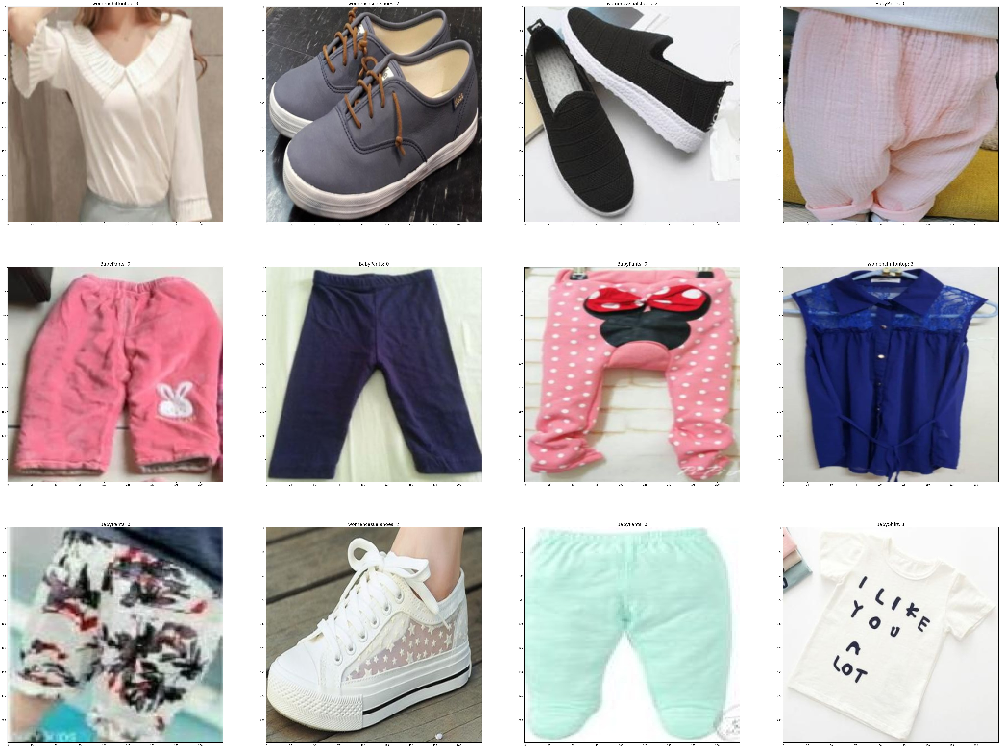

In [7]:
train_dataset.sample(frac=1).iloc[:12].show_images()

### Labels
* 0 Baby Pants
* 1 Baby Shirt
* 2 Women Shoes
* 3 Women Top

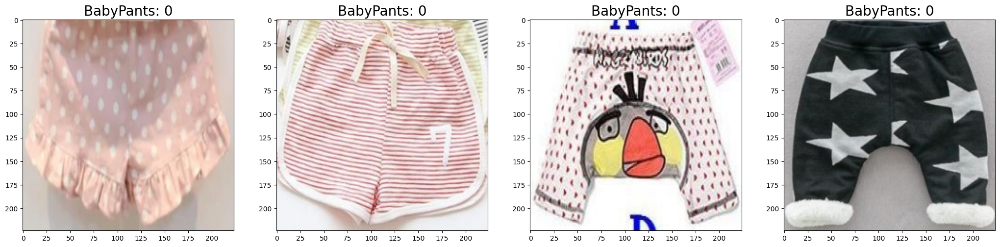

In [8]:
train_dataset.loc[train_dataset['label']==0].iloc[:4].show_images()

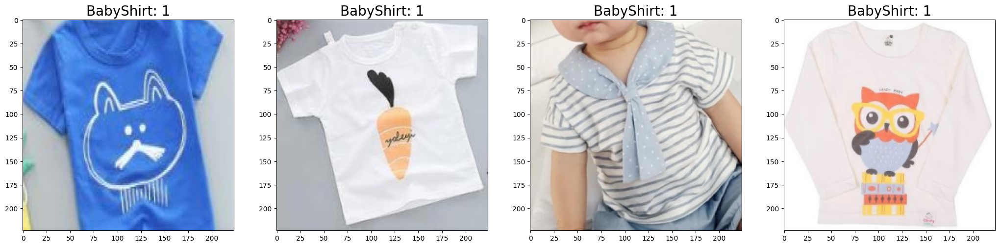

In [9]:
train_dataset.loc[train_dataset['label']==1].iloc[:4].show_images()

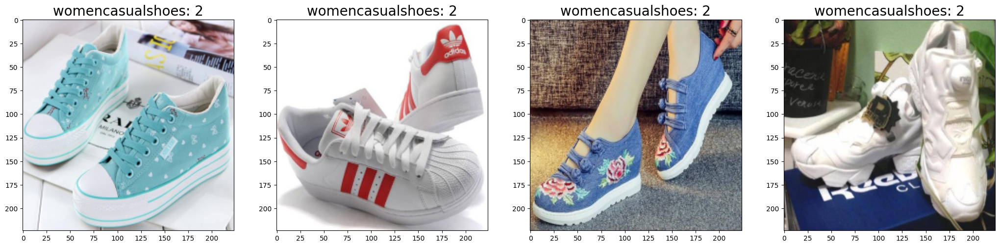

In [10]:
train_dataset.loc[train_dataset['label']==2].iloc[:4].show_images()

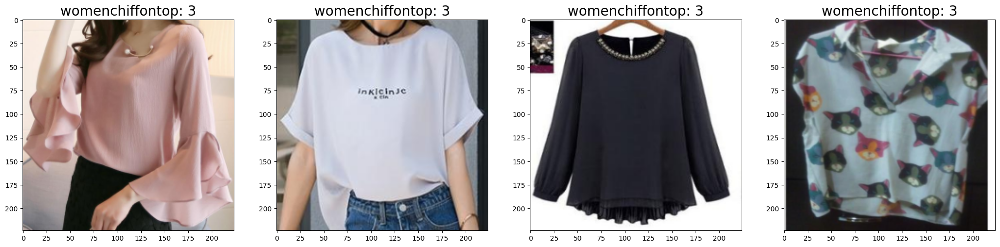

In [11]:
train_dataset.loc[train_dataset['label']==3].iloc[:4].show_images()

### Let's use the default config and take a time limit of 5 min.

In [12]:
predictor = ImagePredictor()
predictor.fit(train_dataset, time_limit=5*60)  

Reset labels to [0, 1, 2, 3]
Randomly split train_data into train[720]/validation[80] splits.
The number of requested GPUs is greater than the number of available GPUs.Reduce the number to 1
Starting fit without HPO
modified configs(<old> != <new>): {
root.misc.seed       42 != 330
root.train.early_stop_patience -1 != 10
root.train.early_stop_baseline 0.0 != -inf
root.train.batch_size 32 != 16
root.train.epochs    200 != 15
root.train.early_stop_max_value 1.0 != inf
root.img_cls.model   resnet101 != resnet50
}
Saved config to /home/ec2-user/SageMaker/Git/Autogluon-Workshop/6d4a7e33/.trial_0/config.yaml
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-rsb-weights/resnet50_a1_0-14fe96d1.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/resnet50_a1_0-14fe96d1.pth
Model resnet50 created, param count:                                         23516228
AMP not enabled. Training in float32.
Disable EMA as it is not supported for now.
Start training from [

### The default model is resnet50, with the best config printed just above.

In [13]:
fit_result = predictor.fit_summary()
print('Top-1 train acc: %.3f, val acc: %.3f' %(fit_result['train_acc'], fit_result['valid_acc']))

Top-1 train acc: 0.733, val acc: 0.887


In [14]:
image_index = 0
image_path = test_dataset.iloc[image_index]['image']
result = predictor.predict(image_path)
print(result)

0    1
Name: label, dtype: int64


### let's have look to test subsample.

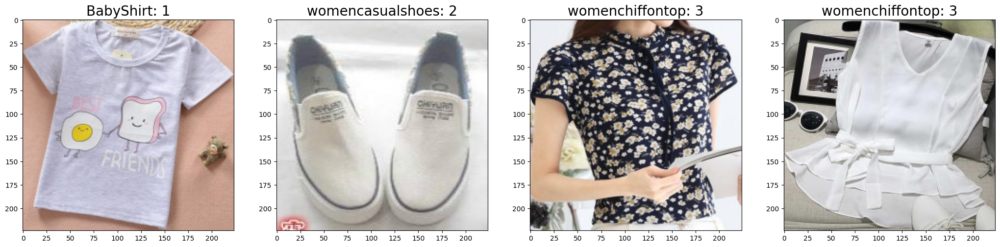

In [15]:
test_sample = test_dataset.sample(frac=1).iloc[:4]
test_sample.show_images()

In [16]:
bulk_result = predictor.predict(test_sample)

In [17]:
bulk_result

21    1
64    3
45    2
61    3
Name: label, dtype: int64

In [18]:
test_sample.label

21    1
64    3
45    2
61    3
Name: label, dtype: int64

## Let's try specific models

In [19]:
print(ImagePredictor.list_models())

('resnet18_v1', 'resnet34_v1', 'resnet50_v1', 'resnet101_v1', 'resnet152_v1', 'resnet18_v2', 'resnet34_v2', 'resnet50_v2', 'resnet101_v2', 'resnet152_v2', 'resnest14', 'resnest26', 'resnest50', 'resnest101', 'resnest200', 'resnest269', 'se_resnet18_v1', 'se_resnet34_v1', 'se_resnet50_v1', 'se_resnet101_v1', 'se_resnet152_v1', 'se_resnet18_v2', 'se_resnet34_v2', 'se_resnet50_v2', 'se_resnet101_v2', 'se_resnet152_v2', 'vgg11', 'vgg13', 'vgg16', 'vgg19', 'vgg11_bn', 'vgg13_bn', 'vgg16_bn', 'vgg19_bn', 'alexnet', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'shufflenet_v1', 'shufflenet_v2', 'squeezenet1.0', 'squeezenet1.1', 'googlenet', 'inceptionv3', 'xception', 'xception71', 'mobilenet1.0', 'mobilenet0.75', 'mobilenet0.5', 'mobilenet0.25', 'mobilenetv2_1.0', 'mobilenetv2_0.75', 'mobilenetv2_0.5', 'mobilenetv2_0.25', 'mobilenetv3_large', 'mobilenetv3_small', 'cifar_resnet20_v1', 'cifar_resnet56_v1', 'cifar_resnet110_v1', 'cifar_resnet20_v2', 'cifar_resnet56_v2', 'cifar_resn

In [20]:
model = ag.Categorical('resnet18_v1b', 'mobilenetv3_small','vgg19','mobilenetv3_small_100','inception_v3')

In [21]:
batch_size = 16
lr = ag.Categorical(1e-2, 1e-3)

In [22]:
hyperparameters={ 'batch_size': batch_size, 'lr': lr, 'model': model,}
predictor = ImagePredictor()
predictor.fit(train_dataset,
              time_limit=5*60, 
              hyperparameters=hyperparameters
             )
print('Top-1 val acc: %.3f' % predictor.fit_summary()['valid_acc'])

ImagePredictor sets accuracy as default eval_metric for classification problems.
Reset labels to [0, 1, 2, 3]
Randomly split train_data into train[720]/validation[80] splits.
The number of requested GPUs is greater than the number of available GPUs.Reduce the number to 1
Starting fit without HPO
In v0.6.0, ImagePredictor will no longer support training MXNet models. Please consider switching to specifying Torch models instead.
Users should ensure they update their code that depends on ImagePredictor when upgrading to future AutoGluon releases.
For more information, refer to this GitHub issue: https://github.com/awslabs/autogluon/issues/1560

modified configs(<old> != <new>): {
root.img_cls.model   resnet50_v1 != resnet18_v1b
root.train.rec_train_idx ~/.mxnet/datasets/imagenet/rec/train.idx != auto
root.train.rec_train ~/.mxnet/datasets/imagenet/rec/train.rec != auto
root.train.lr        0.1 != 0.01
root.train.data_dir  ~/.mxnet/datasets/imagenet != auto
root.train.rec_val   ~/.mxnet/da

42433KB [00:00, 42587.71KB/s]                           
Start training from [Epoch 0]
[Epoch 0] training: accuracy=0.381944
[Epoch 0] speed: 14 samples/sec	time cost: 47.969576
[Epoch 0] validation: top1=0.637500 top5=1.000000
[Epoch 0] Current best top-1: 0.637500 vs previous -inf, saved to /home/ec2-user/SageMaker/Git/Autogluon-Workshop/6d8ca275/.trial_0/best_checkpoint.pkl
[Epoch 1] training: accuracy=0.586111
[Epoch 1] speed: 14 samples/sec	time cost: 49.584224
[Epoch 1] validation: top1=0.737500 top5=1.000000
[Epoch 1] Current best top-1: 0.737500 vs previous 0.637500, saved to /home/ec2-user/SageMaker/Git/Autogluon-Workshop/6d8ca275/.trial_0/best_checkpoint.pkl
[Epoch 2] training: accuracy=0.658333
[Epoch 2] speed: 14 samples/sec	time cost: 46.935727
[Epoch 2] validation: top1=0.787500 top5=1.000000
[Epoch 2] Current best top-1: 0.787500 vs previous 0.737500, saved to /home/ec2-user/SageMaker/Git/Autogluon-Workshop/6d8ca275/.trial_0/best_checkpoint.pkl
[Epoch 3] training: accura

Top-1 val acc: 0.825


In [23]:
results = predictor.evaluate(test_dataset)
print('Test acc on hold-out data:', results)

Test acc on hold-out data: {'top1': 0.7875, 'top5': 1.0}


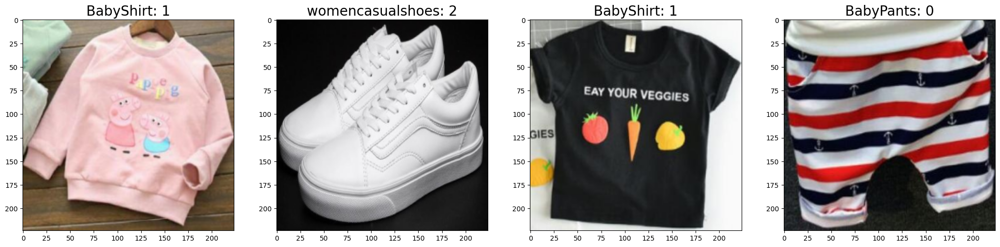

In [24]:
test_sample = test_dataset.sample(frac=1).iloc[:4]
test_sample.show_images()

In [25]:
bulk_result = predictor.predict(test_sample)
bulk_result

3     2
49    2
28    1
38    1
Name: label, dtype: int64

In [26]:
test_sample.label

3     0
49    2
28    1
38    1
Name: label, dtype: int64

### Let's see the result with more training time

In [28]:
hyperparameters={'model': model, 'batch_size': batch_size, 'lr': lr}

predictor = ImagePredictor()
predictor.fit(train_dataset,
              time_limit=15*60, 
              hyperparameters=hyperparameters
             )
print('Top-1 val acc: %.3f' % predictor.fit_summary()['valid_acc'])

ImagePredictor sets accuracy as default eval_metric for classification problems.
Reset labels to [0, 1, 2, 3]
Randomly split train_data into train[720]/validation[80] splits.
The number of requested GPUs is greater than the number of available GPUs.Reduce the number to 1
Starting fit without HPO
In v0.6.0, ImagePredictor will no longer support training MXNet models. Please consider switching to specifying Torch models instead.
Users should ensure they update their code that depends on ImagePredictor when upgrading to future AutoGluon releases.
For more information, refer to this GitHub issue: https://github.com/awslabs/autogluon/issues/1560

modified configs(<old> != <new>): {
root.img_cls.model   resnet50_v1 != resnet18_v1b
root.train.rec_train_idx ~/.mxnet/datasets/imagenet/rec/train.idx != auto
root.train.rec_train ~/.mxnet/datasets/imagenet/rec/train.rec != auto
root.train.lr        0.1 != 0.01
root.train.data_dir  ~/.mxnet/datasets/imagenet != auto
root.train.rec_val   ~/.mxnet/da

Top-1 val acc: 0.900


In [29]:
results = predictor.evaluate(test_dataset)
print('Test acc on hold-out data:', results)

Test acc on hold-out data: {'top1': 0.8125, 'top5': 1.0}


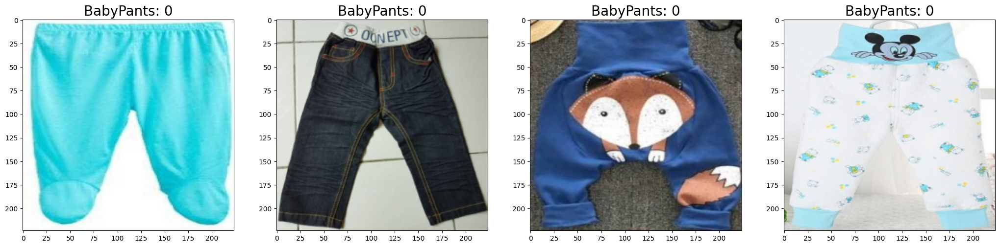

In [30]:
test_dataset.iloc[10:14].show_images()

In [31]:
bulk_result = predictor.predict(test_dataset.iloc[10:14])
bulk_result

10    0
11    3
12    0
13    0
Name: label, dtype: int64